In [1]:
# Imports
import sys
import numpy as np
import math
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import clear_output
import datetime
import geopandas as gpd
import sklearn

import warnings
warnings.filterwarnings('ignore')

#networkx graph computing library
import networkx as nx

#opensourcemap networkx geopandas library
import osmnx as ox

# to create Point objects that can be used with the GeoDataFrame.contains(Point) boolean method
from shapely.geometry import Point

train_path = '/Users/trystenhess/Desktop/CS/internshipPENN/project_stuff/penn_env/psi_protocol/ny_dataset/train.csv'
man_filter_path = '/Users/trystenhess/Desktop/CS/internshipPENN/project_stuff/penn_env/psi_protocol/ny_dataset/contained_in_man.csv'

In [2]:
!pwd

/Users/trystenhess/Desktop/CS/internshipPENN/project_stuff/penn_env/psi_protocol


In [3]:
G_oms = ox.graph.graph_from_place('Manhattan, New York City', network_type='all_private', simplify=True, retain_all=False, truncate_by_edge=False, which_result=None, buffer_dist=None, clean_periphery=True, custom_filter=None)

In [88]:
# lots of useful stats about Manhattan map city

ox.stats.basic_stats(G_oms)

{'n': 33180,
 'm': 96127,
 'k_avg': 5.794273658830621,
 'edge_length_total': 3870317.581999933,
 'edge_length_avg': 40.262544155127415,
 'streets_per_node_avg': 3.37040385774563,
 'streets_per_node_counts': {0: 0,
  1: 2802,
  2: 54,
  3: 12701,
  4: 17324,
  5: 276,
  6: 20,
  7: 3},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.08444846292947558,
  2: 0.0016274864376130199,
  3: 0.382790837854129,
  4: 0.5221217600964436,
  5: 0.008318264014466547,
  6: 0.0006027727546714888,
  7: 9.041591320072333e-05},
 'intersection_count': 30378,
 'street_length_total': 2378343.5229999903,
 'street_segment_count': 55894,
 'street_length_avg': 42.5509629477223,
 'circuity_avg': 1.037627626920747,
 'self_loop_proportion': 0.001019787454825205}

In [5]:
# length in meters

edge_length_avg = 40.26 #meters
one_lat_degree = 110947.2 #meters
one_lon_degree = 87843.36 #meters

In [213]:
#taken from. https://github.com/gboeing/osmnx
def great_circle_vec(lat1, lng1, lat2, lng2, earth_radius=6371009):
    '''
    Function for finding distance between two points along sphere (Earth)
    
    parameters:
        lat1, lng1, lat2, lng2, earth_radius(ints): lat and long points used to convert into spherical coordinates
        
    returns:
        distance between input poin
    '''
    
    phi1 = np.deg2rad(90 - lat1)

    phi2 = np.deg2rad(90 - lat2)

    theta1 = np.deg2rad(lng1)
    theta2 = np.deg2rad(lng2)

    cos = (np.sin(phi1) * np.sin(phi2) * np.cos(theta1 - theta2) + np.cos(phi1) * np.cos(phi2))
    arc = np.arccos(cos)

    distance = arc * earth_radius
   
    return distance


def get_nearest_node(G, point, return_dist=False):
    '''
    Function for finding the nearest node to the given point
    
    parameters:
        G(networkx.classes.multidigraph.MultiDiGraph): networkX MultiDiGraph containing collection of nodes
        
        point(shapely.geometry.Point): point that will be placed on G to locate the nearest node in G
        
        return_dist(bool): Returns distance to nearest node if desired
        
    returns:
        nearest_node(shapely.geometry.Point)
        distances IF return_dist is True
    '''
    coords = np.array([[node, data['x'], data['y']] for node, data in G.nodes(data=True)])
    df = pd.DataFrame(coords, columns=['node', 'x', 'y']).set_index('node')
    df['reference_y'] = point[0]
    df['reference_x'] = point[1]

    distances = great_circle_vec(lat1=df['reference_y'],
                                 lng1=df['reference_x'],
                                 lat2=df['x'].astype('float'),
                                 lng2=df['y'].astype('float'))
  
    nearest_node = int(distances.idxmin())
  
    if return_dist:
        return nearest_node, distances.loc[nearest_node]
    else:
        return nearest_node

In [6]:
train = pd.read_csv(train_path)
manhattan_filter = pd.read_csv(man_filter_path, names=['in_man'])
train_man = train[manhattan_filter['in_man']]

In [6]:
train_man['id'].value_counts()

id2643491    1
id0279380    1
id3819419    1
id1812475    1
id1979561    1
            ..
id2708836    1
id3141874    1
id1061036    1
id1327822    1
id2264067    1
Name: id, Length: 1232404, dtype: int64

In [7]:
train_man.isna().sum()

id                    0
vendor_id             0
pickup_datetime       0
dropoff_datetime      0
passenger_count       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude     0
dropoff_latitude      0
store_and_fwd_flag    0
trip_duration         0
dtype: int64

# average passenger count

In [7]:
average_passenger_count = round(train_man['passenger_count'].mean(),2)
average_passenger_count

N = len(train_man)

one_passenger_p = len(train_man[train_man['passenger_count'] == 1])*100/N
two_passenger_p = len(train_man[train_man['passenger_count'] == 2])*100/N
three_passenger_p = len(train_man[train_man['passenger_count'] == 3])*100/N
four_passenger_p = len(train_man[train_man['passenger_count'] == 4])*100/N

print(f"Average passenger count: {average_passenger_count}")
print(f"{round(one_passenger_p, 2)}% of trips have 1 passenger")
print(f"{round(two_passenger_p,2)}%  of trips have 2 passenger")
print(f"{round(three_passenger_p,2)}%  of trips have 3 passenger")
print(f"{round(four_passenger_p,2)}%  of trips have 4 passenger")

Average passenger count: 1.66
71.08% of trips have 1 passenger
14.2%  of trips have 2 passenger
4.12%  of trips have 3 passenger
1.95%  of trips have 4 passenger


# Going to have a maximum route deviation as a parameter for determining shareability so we can find shareable rides that would be shared in between routes

I'm going to use the route-agnostic protocol used in the Modeling and Prediction of Ride-Sharing Utilization Dynamics paper, on top of route overlap, it can be seen that a route overlap of one node means a crossing of routes, perpendicular to each other, which doesn't add to shareability. To work with route overlap I'm going to calculate distances of start/endpoints of some routes, A and B, and see if picking up a passenger for some route, B, would not force too large a deviation from the current route, A.

Going to work with trips that have one passenger as to focus solely on shreability and decrease number of parameters I'm working with

In [8]:
train_man = train_man[train_man['passenger_count'] == 1]

# average speed in Manhattan is 7.1 miles/h = 3.17 meters/s, according to NYC Mobility report 2018

In [9]:
avg_speed = 3.17 #almost pi :o

Clean the data to work with only points within Manhattan to work in smaller region

In [7]:
location = 'Manhattan, New York City'
manhattan_boundaries = ox.geocoder.geocode_to_gdf(location)
contained_in_man = []
done = 0
N = len(train)

for index, row in train.iterrows():
    pickup_point = Point(row['pickup_longitude'], row['pickup_latitude'])
    dropoff_point = Point(row['dropoff_longitude'], row['dropoff_latitude'])
    contained_in_man.append(manhattan_boundaries.contains(pickup_point) & manhattan_boundaries.contains(dropoff_point))
    clear_output(wait=True)
    done += 1
    print(f"PERCENT DONE: {(done/N)*100}%")  

PERCENT DONE: 100.0%


In [35]:
train_man = train[manhattan_filter['in_man']]

# Found taxi trips that were supposedly around 24hours long, bad points! Forgot to clean these smh!

In [238]:
# Going to take taxi trips that are less than two hours, 7200 seconds
train_man_sample = train_man_sample[train_man_sample['trip_duration']<7200]

Find most popular day and work with that

In [10]:
train_man['pickup_date'] = train_man['pickup_datetime'].apply(lambda x: x[0:10])

In [11]:
train_man.groupby(['pickup_date']).size().sort_values()

pickup_date
2016-01-23     923
2016-01-24    1923
2016-05-30    2890
2016-05-29    3412
2016-01-03    3486
              ... 
2016-04-15    5626
2016-03-03    5638
2016-03-04    5647
2016-04-09    5659
2016-02-11    5824
Length: 182, dtype: int64

Most active date in the DF is 2016-04-09, we'll take a sample from here

In [12]:
train_man_sample = train_man[train_man['pickup_date'] == '2016-04-09'].sort_values(['pickup_datetime'])

In [13]:
train_man_sample

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_date
20224,id3746230,1,2016-04-09 00:00:08,2016-04-09 00:10:22,1,-73.991249,40.734783,-73.975861,40.723957,Y,614,2016-04-09
398351,id1534170,2,2016-04-09 00:01:02,2016-04-09 00:11:54,1,-73.988678,40.717751,-73.990372,40.723560,N,652,2016-04-09
359004,id2107058,2,2016-04-09 00:01:05,2016-04-09 00:37:40,1,-74.009132,40.716461,-73.981361,40.780788,N,2195,2016-04-09
237110,id0137659,2,2016-04-09 00:01:17,2016-04-09 00:27:06,1,-74.003777,40.726040,-73.947571,40.771271,N,1549,2016-04-09
802852,id0596164,2,2016-04-09 00:01:53,2016-04-09 00:12:59,1,-73.983719,40.730160,-73.990921,40.718391,N,666,2016-04-09
...,...,...,...,...,...,...,...,...,...,...,...,...
656239,id3710283,1,2016-04-09 23:59:36,2016-04-10 00:04:25,1,-73.965645,40.754227,-73.950417,40.771809,N,289,2016-04-09
495199,id2196731,1,2016-04-09 23:59:36,2016-04-10 00:20:26,1,-74.007202,40.718861,-73.989578,40.763466,N,1250,2016-04-09
626334,id3517261,2,2016-04-09 23:59:45,2016-04-10 00:05:29,1,-73.987862,40.759769,-73.974556,40.762119,N,344,2016-04-09
343888,id1446867,1,2016-04-09 23:59:50,2016-04-10 00:07:59,1,-73.972633,40.780869,-73.967300,40.763279,N,489,2016-04-09


Make a list of time intervals of 5mins

My reasoning is that people are "busy"! Waiting more than 5 minutes for a ride seems to be counterproductive for todays apps like Uber and Lyft, at least in a busy city like New York

In [14]:
time_intervals = pd.date_range(start="2016-04-09 00:00:00", end = "2016-04-10 00:00:00", freq="5min")

In [15]:
time_intervals

DatetimeIndex(['2016-04-09 00:00:00', '2016-04-09 00:05:00',
               '2016-04-09 00:10:00', '2016-04-09 00:15:00',
               '2016-04-09 00:20:00', '2016-04-09 00:25:00',
               '2016-04-09 00:30:00', '2016-04-09 00:35:00',
               '2016-04-09 00:40:00', '2016-04-09 00:45:00',
               ...
               '2016-04-09 23:15:00', '2016-04-09 23:20:00',
               '2016-04-09 23:25:00', '2016-04-09 23:30:00',
               '2016-04-09 23:35:00', '2016-04-09 23:40:00',
               '2016-04-09 23:45:00', '2016-04-09 23:50:00',
               '2016-04-09 23:55:00', '2016-04-10 00:00:00'],
              dtype='datetime64[ns]', length=289, freq='5T')

# We want to test: during a given time window (say 15 min), what's the chance that two routes share a lot of road segments so that ride-sharing makes sense.

Examine average overlap within a 5min timeframe

In [16]:
start = str(time_intervals[0])
end = str(time_intervals[1])

data_within_range = train_man_sample[(start <= train_man_sample['pickup_datetime']) & (end >= train_man_sample['pickup_datetime'])]

In [17]:
data_within_range

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_date
20224,id3746230,1,2016-04-09 00:00:08,2016-04-09 00:10:22,1,-73.991249,40.734783,-73.975861,40.723957,Y,614,2016-04-09
398351,id1534170,2,2016-04-09 00:01:02,2016-04-09 00:11:54,1,-73.988678,40.717751,-73.990372,40.723560,N,652,2016-04-09
359004,id2107058,2,2016-04-09 00:01:05,2016-04-09 00:37:40,1,-74.009132,40.716461,-73.981361,40.780788,N,2195,2016-04-09
237110,id0137659,2,2016-04-09 00:01:17,2016-04-09 00:27:06,1,-74.003777,40.726040,-73.947571,40.771271,N,1549,2016-04-09
802852,id0596164,2,2016-04-09 00:01:53,2016-04-09 00:12:59,1,-73.983719,40.730160,-73.990921,40.718391,N,666,2016-04-09
699509,id1990441,1,2016-04-09 00:01:54,2016-04-09 00:05:15,1,-73.956367,40.778484,-73.961784,40.767258,N,201,2016-04-09
1185411,id3735664,1,2016-04-09 00:02:32,2016-04-09 00:26:39,1,-73.965034,40.759678,-73.995377,40.719551,N,1447,2016-04-09
485442,id1619401,2,2016-04-09 00:02:35,2016-04-09 00:11:42,1,-73.988426,40.739613,-73.993515,40.745354,N,547,2016-04-09
142470,id3045845,1,2016-04-09 00:02:49,2016-04-09 00:15:34,1,-74.000229,40.737495,-74.014061,40.702534,N,765,2016-04-09
813355,id3608091,2,2016-04-09 00:02:52,2016-04-09 00:09:53,1,-74.004196,40.733349,-74.006775,40.743858,N,421,2016-04-09


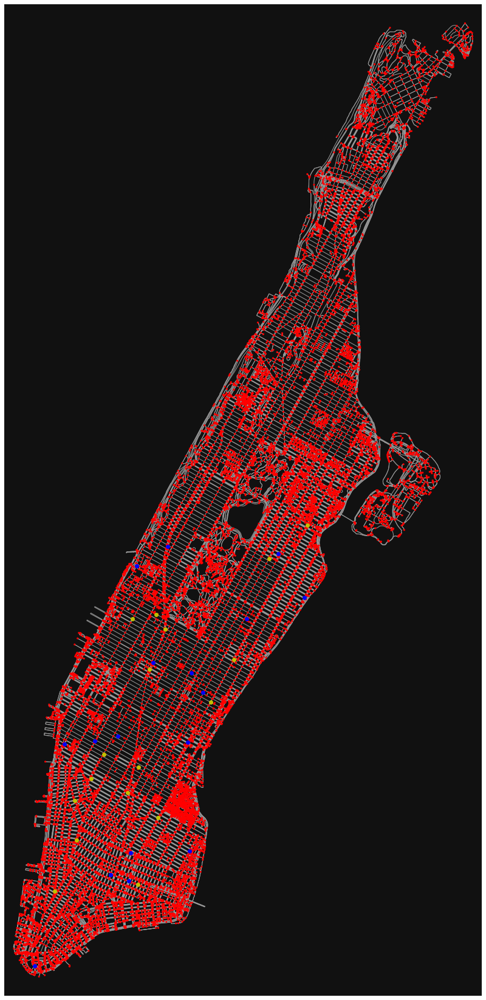

In [18]:
data_within_range_pickup_longs = data_within_range['pickup_longitude']
data_within_range_pickup_lats = data_within_range['pickup_latitude']
data_within_range_dropoff_longs = data_within_range['dropoff_longitude']
data_within_range_dropoff_lats = data_within_range['dropoff_latitude']

fig, ax = ox.plot.plot_graph(G_oms, figsize=(30, 30), node_color = 'r', node_size = 10, show=False, close=False)
ax.scatter(data_within_range_pickup_longs, data_within_range_pickup_lats, c='y')
ax.scatter(data_within_range_dropoff_longs, data_within_range_dropoff_lats, c='b')
plt.show()

In [125]:
# refactored from https://www.kaggle.com/usui113yst/basic-network-analysis-tutorial?select=manhatten.graphml
# using solely OSMNX packages

def find_shortest_routes(dataframe):
    """
    Parameters:
        dataframe: trip df with pickup and dropoff locations
    Returns:  
      shortest_routes: list of OSM graph nodes that constitute shortest paths from pickup to dropoff locations
      
    Extra notes:
        Added a percentage calculator since large datasets take a long while to process this information
    """
    N = len(dataframe)
    shortest_routes = []
    lengths = []
    finished = 0
    row_count = len(dataframe)
    row_counter = 0
    for index, row in dataframe.iterrows():
        pick_point = (row['pickup_longitude'], row['pickup_latitude'])
        drop_point = (row['dropoff_longitude'], row['dropoff_latitude'])

        #below return the node id from G_oms of closest node
        pick_node = ox.distance.nearest_nodes(G_oms, pick_point[0], pick_point[1], return_dist=False)
        drop_node = ox.distance.nearest_nodes(G_oms, drop_point[0], drop_point[1], return_dist=False)

        try:
            route = ox.distance.shortest_path(G_oms, pick_node, drop_node, weight='length')
            if route:
                length = nx.classes.function.path_weight(G_oms, route, weight='length')
            else:
                route = []
                length = 0
            shortest_routes.append(route)
            lengths.append(length)
                #plot the shortest path on the graph
                #fig, ax = ox.plot_graph_route(G, route,fig_height=15, node_size=1)
        except:
            pass
        
        row_counter += 1
        finished += 1

        clear_output(wait=True)
        print("PERCENTAGE DONE: ", (finished/N)*100, "%")
            
    return shortest_routes, lengths

def find_k_shortest_routes(dataframe):
    """
    Parameters:
        dataframe: trip df with pickup and dropoff locations
    Returns:  
      shortest_routes: list of OSM graph nodes that constitute shortest paths from pickup to dropoff locations
      
    Extra notes:
        Added a percentage calculator since large datasets take a long while to process this information
    """
    shortest_routes = []
    lengths = []
    finished = 0
    row_count = len(dataframe)
    for index, row in dataframe.iterrows():
        pick_point = (row['pickup_longitude'], row['pickup_latitude'])
        drop_point = (row['dropoff_longitude'], row['dropoff_latitude'])

        #below return the node id from G_oms of closest node
        pick_node = ox.distance.nearest_nodes(G_oms, pick_point[0], pick_point[1], return_dist=False)
        drop_node = ox.distance.nearest_nodes(G_oms, drop_point[0], drop_point[1], return_dist=False)

        try:
            routes = ox.distance.k_shortest_paths(G_oms, pick_node, drop_node, k = 3, weight='length')
            length = nx.shortest_path_length(G=G_oms, source=pick_node, target=drop_node, weight='length')
            shortest_routes.append(routes)
            lengths.append(length)
                #plot the shortest path on the graph
                #fig, ax = ox.plot_graph_route(G, route,fig_height=15, node_size=1)
        except:
            pass

        finished += 1

        clear_output(wait=True)
        print("PERCENTAGE DONE: ", (finished/row_count)*100, "%")
            
    return shortest_routes, lengths

In [23]:
shortest_routes, lengths = find_shortest_routes(data_within_range)
data_within_range['pp_to_dp'] = shortest_routes
data_within_range['len_pp_to_dp'] = lengths

PERCENTAGE DONE:  100.0 %


In [24]:
data_within_range

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_date,pp_to_dp,len_pp_to_dp
20224,id3746230,1,2016-04-09 00:00:08,2016-04-09 00:10:22,1,-73.991249,40.734783,-73.975861,40.723957,Y,614,2016-04-09,"[4983147898, 7581217744, 7581217746, 719628477...",2099.905
398351,id1534170,2,2016-04-09 00:01:02,2016-04-09 00:11:54,1,-73.988678,40.717751,-73.990372,40.723560,N,652,2016-04-09,"[8231896473, 2567557320, 7465370993, 746537099...",890.853
359004,id2107058,2,2016-04-09 00:01:05,2016-04-09 00:37:40,1,-74.009132,40.716461,-73.981361,40.780788,N,2195,2016-04-09,"[8304497527, 8304497528, 8304498508, 830449848...",7846.246
237110,id0137659,2,2016-04-09 00:01:17,2016-04-09 00:27:06,1,-74.003777,40.726040,-73.947571,40.771271,N,1549,2016-04-09,"[8307641858, 8307641857, 6491645895, 830764185...",8129.175
802852,id0596164,2,2016-04-09 00:01:53,2016-04-09 00:12:59,1,-73.983719,40.730160,-73.990921,40.718391,N,666,2016-04-09,"[8309479585, 8309479591, 8309479586, 830947927...",1452.133
699509,id1990441,1,2016-04-09 00:01:54,2016-04-09 00:05:15,1,-73.956367,40.778484,-73.961784,40.767258,N,201,2016-04-09,"[42435509, 42447126, 42439399, 42447115, 42438...",1550.599
1185411,id3735664,1,2016-04-09 00:02:32,2016-04-09 00:26:39,1,-73.965034,40.759678,-73.995377,40.719551,N,1447,2016-04-09,"[6188803954, 42432861, 42442960, 42442959, 424...",5304.118
485442,id1619401,2,2016-04-09 00:02:35,2016-04-09 00:11:42,1,-73.988426,40.739613,-73.993515,40.745354,N,547,2016-04-09,"[5481897719, 4276517116, 42428192, 8264671706,...",1296.257
142470,id3045845,1,2016-04-09 00:02:49,2016-04-09 00:15:34,1,-74.000229,40.737495,-74.014061,40.702534,N,765,2016-04-09,"[8309479755, 8262308355, 8262308356, 826230835...",4273.906
813355,id3608091,2,2016-04-09 00:02:52,2016-04-09 00:09:53,1,-74.004196,40.733349,-74.006775,40.743858,N,421,2016-04-09,"[8307642027, 8307642026, 4841945995, 830764201...",1511.191


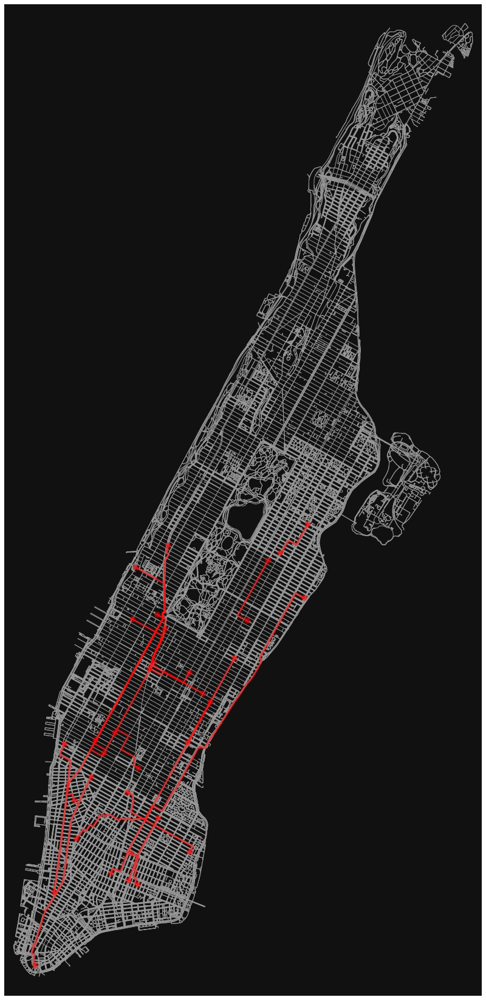

In [63]:
fig, ax = ox.plot_graph_routes(G_oms, list(data_within_range['pp_to_dp']), figsize=(30, 30), route_linewidth=6, node_size=0)

Below code is so inefficient, I realize now how poor a method this is

In [129]:
def overlap_matrix(df):
    """
    parameters:
        df(Pandas.DataFrame)
        
    returns:
        matrix(size x size): matrix with tuple values of (num_shared, average) at matrix[i][j]
            num_shared(int): count of intersecting nodes between row i and row j of df
            average: fractional average of shared nodes with respect to the lengs of the two row's paths
            
        overlaps(list(ints)): list of all the averages for visualization purposes
     """
    size = len(df)
    
    matrix = [[0]*size for row in range(size)]
    overlaps = []
    
    shareable = []

    finished = 0

    for row_ind in range(size):
        for col_ind in range(size):
            if row_ind != col_ind:
                path1 = df['pp_to_dp'].iloc[row_ind]
                path2 = df['pp_to_dp'].iloc[col_ind]

                if path1 is None or path2 is None:
                    average = 0
                    overlaps.append(0)
                    
                else:
                    path1_len = len(path1)
                    path2_len = len(path2)

                    shared_nodes = [node for node in path1 if node in path2]

                    num_shared = len(shared_nodes)

                    path1_overlap = (num_shared/path1_len)*100
                    path2_overlap = (num_shared/path2_len)*100
                    
                    if path1_overlap or path2_overlap >= 50:
                        pair = (df['id'].iloc[row_ind], df['id'].iloc[col_ind])
                        shareable.append(pair)
                    
                    average = 2*num_shared/(path1_len + path2_len)
                    
                    overlaps.append(round(average, 6))

                matrix[row_ind][col_ind] = (num_shared, average)

            finished += 1
            clear_output(wait=True)
            print("PERCENTAGE DONE: ", (finished/(size**2))*100, "%")
            
    return matrix, overlaps, shareable

I need to think of more parameters to determine shareability, because what if two routes are similar but don't overlap because they are an edge or two away but parallel? This is one possibility of a shareable route, and I have a feeling there are more.

In [209]:
def approximate_dist(node1, node2):
    node1_lon = G_oms.nodes[node1]['x']
    node1_lat = G_oms.nodes[node1]['y']
    node2_lon = G_oms.nodes[node2]['x']
    node2_lat = G_oms.nodes[node2]['y']
    
    dist = abs(node1_lon-node2_lon)*one_lon_degree + abs(node1_lat-node2_lat)*one_lat_degree
    return dist

def approximate_dist_z(node1, node2):
    node1_lon = G_oms.nodes[node1]['x']
    node1_lat = G_oms.nodes[node1]['y']
    node2_lon = G_oms.nodes[node2]['x']
    node2_lat = G_oms.nodes[node2]['y']
    dist = great_circle_vec(node1_lat, node1_lon, node2_lat, node2_lon)
    return dist

def approximate_dist_z_parametrize(node1, node2):
    node1_lon = G_oms.nodes[node1]['x']
    node1_lat = G_oms.nodes[node1]['y']
    node2_lon = G_oms.nodes[node2]['x']
    node2_lat = G_oms.nodes[node2]['y']
    x_squared = ((node1_lon-node2_lon)*one_lon_degree)**2
    y_squared = ((node1_lat-node2_lat)*one_lat_degree)**2
    dist = np.sqrt(x_squared + y_squared)
    return dist*1.25

In [ ]:
def check_shareable(route1, route2):
    if route1 is None or route2 is None:
        return 0
    
    share_found = False
    
    start_route1 = route1[0]
    end_route1 = route1[-1]
    start_route2 = route2[0]
    end_route2 = route2[-1]
                    
    else:
        path1_len = len(route1)
        path2_len = len(route2)
        shared_nodes = [node for node in route1 if node in route2]

        num_shared = len(shared_nodes)

        route1_overlap = (num_shared/path1_len)*100
        route2_overlap = (num_shared/path2_len)*100

        if route1_overlap >= 50 or route2_overlap >= 50:
            share_found = True
            fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)

        # ensure that we aren't picking up a passenger on opposite side of route, ensure it's along the way
        elif (approximate_dist(start_route2, start_route1) < approximate_dist(start_route1, end_route2)) or (approximate_dist(start_route2, start_route1) < approximate_dist(start_route2, end_route1)):

            try:

                dist_starts = approximate_dist(start_route1, start_route2)
                dist_ends = approximate_dist(end_route1, end_route2)

                # if they have similar start and finish, great, easiest check
                if dist_starts and dist_ends <= max_deviation:
                    share_found = True
                    fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)

                # Two paths, A and B
                # If path A starts near path B, and path A ends near path B, BAA'B'
                # If path A starts near Path B, and path B ends near path A, BAB'A'
                # ABB'A'
                # ABA'B'
                elif share_found is False:
                    # BAA'B'
                    node_ind = 0
                    while node_ind < path2_len and share_found is False:
                        node = route2[node_ind]
                        appr_dist = approximate_dist(start_route1, node)
                        if appr_dist <= max_deviation:
                            share_found = True
                            fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)

                    # BAB'A'
                    node_ind = 0
                    while node_ind < path1_len and share_found is False:
                        node = route1[node_ind]
                        appr_dist = approximate_dist(end_route2, node)
                        if appr_dist <= max_deviation:
                            share_found = True
                            fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)
                    # ABB'A'
                    node_ind = 0
                    while node_ind < path1_len and share_found is False:
                        node = route1[node_ind]
                        appr_dist = approximate_dist(end_route2, node)
                        if appr_dist <= max_deviation:
                            share_found = True
                            fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)
                    # ABA'B'
                    node_ind = 0
                    while node_ind < path1_len and share_found is False:
                        node = route1[node_ind]
                        appr_dist = approximate_dist(end_route2, node)
                        if appr_dist <= max_deviation:
                            share_found = True
                            fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)


INDEX 1:  0
INDEX 2:  1
INDEX 1:  1
INDEX 2:  2
INDEX 1:  2
INDEX 2:  3
INDEX 1:  3
INDEX 2:  4
INDEX 1:  4
INDEX 2:  5
******************************
******************************

WORKING WITH PATH 2 AS INDEX 5 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 6 OF 17
PRINTING GRAPH


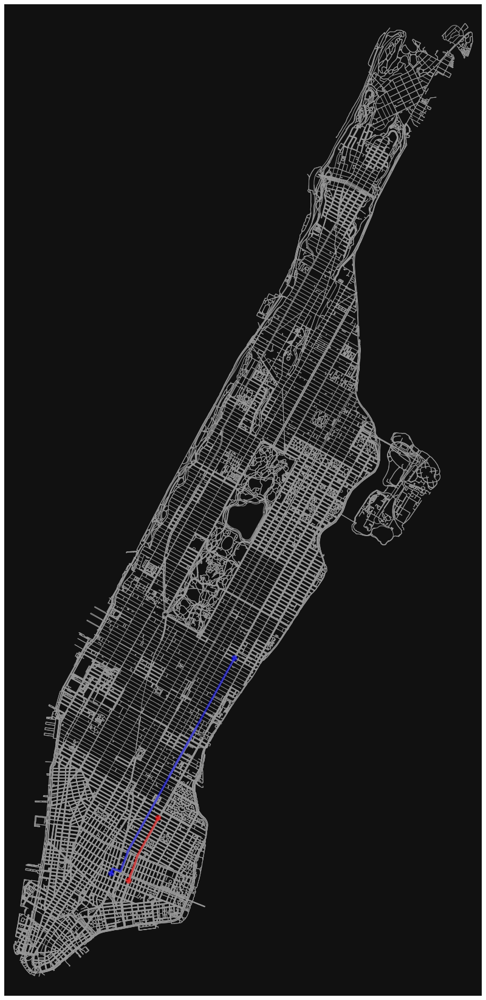

******************************
******************************

WORKING WITH PATH 2 AS INDEX 7 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 8 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 9 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 10 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 11 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 12 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 13 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 14 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 15 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 16

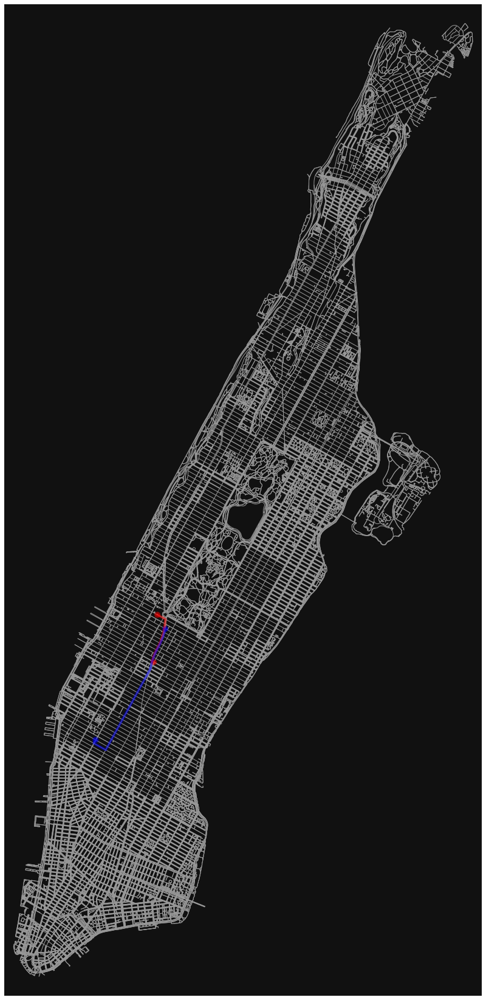

******************************
******************************

WORKING WITH PATH 2 AS INDEX 13 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 14 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 15 OF 17
PRINTING GRAPH


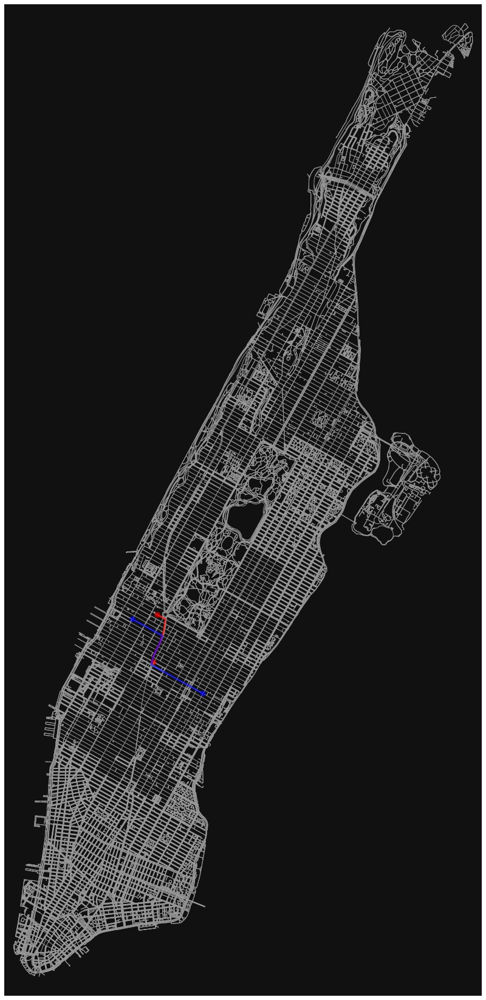

******************************
******************************

WORKING WITH PATH 2 AS INDEX 16 OF 17
INDEX 1:  12
INDEX 2:  13
******************************
******************************

WORKING WITH PATH 2 AS INDEX 13 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 14 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 15 OF 17
******************************
******************************

WORKING WITH PATH 2 AS INDEX 16 OF 17
INDEX 1:  13
INDEX 2:  14
******************************
******************************

WORKING WITH PATH 2 AS INDEX 14 OF 17
INDEX 1:  14
INDEX 2:  15
******************************
******************************

WORKING WITH PATH 2 AS INDEX 15 OF 17
PRINTING GRAPH


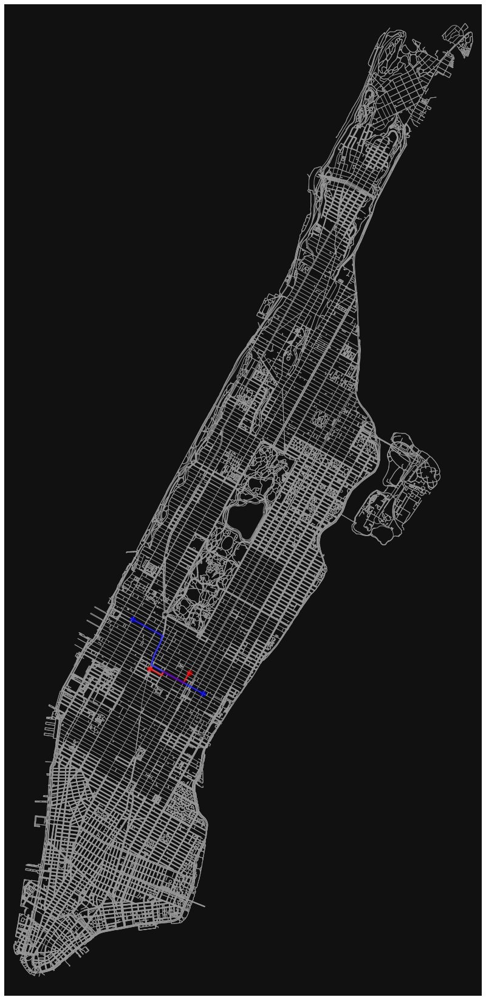

******************************
******************************

WORKING WITH PATH 2 AS INDEX 16 OF 17
INDEX 1:  15
INDEX 2:  16
******************************
******************************

WORKING WITH PATH 2 AS INDEX 16 OF 17
INDEX 1:  16
INDEX 2:  17


In [106]:
# max deviation in meters, average speed*300 seconds (5mins waittime)

max_deviation = 951

N = len(data_within_range)

finished = 0
share_found = False

shareable_pairs = []

ind1 = 0
while ind1 < N and share_found is False:
    route1 = data_within_range['pp_to_dp'].iloc[ind1]
    start_node1 = route1[0]
    end_node1 = route1[-1]
    
    ind2 = ind1+1
    while ind2 < N and share_found is False:
        route2 = data_within_range['pp_to_dp'].iloc[ind2]
        if route1 and route2:
            path1_len = len(route1)
            path2_len = len(route2)

            shared_nodes = [node for node in route1 if node in route2]

            num_shared = len(shared_nodes)

            route1_overlap = (num_shared/path1_len)*100
            route2_overlap = (num_shared/path2_len)*100
            
            if route1_overlap >= 50 or route2_overlap >= 50:
                fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)

            # https://eng.lyft.com/matchmaking-in-lyft-line-691a1a32a008#.qyjkdzf8k
            # we want the route overlaps to also involve not going backwards, which Lyft found that passengers do not like, this also leads to false shareability
            elif (approximate_dist(start_node2, start_node1) < approximate_dist(start_node1, end_node2)) or (approximate_dist(start_node2, start_node1) < approximate_dist(start_node2, end_node1)):
                start_node2 = route2[0]
                end_node2 = route2[-1]

                try:
                    start_node1 = route1[0]
                    start_node2 = route2[0]
                    end_node1 = route1[-1]
                    end_node2 = route2[-1]

                    dist_starts = approximate_dist(start_node1, start_node2)
                    dist_ends = approximate_dist(end_node1, end_node2)

                    # if they have similar start and finish, great, easiest check
                    if dist_starts and dist_ends <= max_deviation:
                        share_found = True
                        fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)

                    # Two paths, A and B
                    # If path A starts near path B, and path A ends near path B, good
                    # If path A starts near Path B, and path B ends near path A, good
                    # Vice versa
                    elif share_found is False:
                        # If path A starts near path B, and path A ends near path B
                        node_ind = 0
                        while node_ind < path2_len and share_found is False:
                            node = route2[node_ind]
                            appr_dist = approximate_dist(start_node1, node)
                            if appr_dist <= max_deviation:
                                # share_found = True
                                fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)

                        # If path A starts near Path B, and path B ends near path A
                        node_ind = 0
                        while node_ind < path1_len and share_found is False:
                            node = route1[node_ind]
                            appr_dist = approximate_dist(end_node2, node)
                            if appr_dist <= max_deviation:
                                share_found = True
                                fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)
                        # If path B starts near Path A, and path B ends near path A
                        node_ind = 0
                        while node_ind < path1_len and share_found is False:
                            node = route1[node_ind]
                            appr_dist = approximate_dist(end_node2, node)
                            if appr_dist <= max_deviation:
                                share_found = True
                                fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)
                    elif dist_starts <= max_deviation and share_found is False:
                    
                    elif dist_starts <= max_deviation and share_found is False:
                        # see if route1 finishes near middle of route2
                        node_ind = 0
                        len_route2 = len(route2)
                        while node_ind < len_route2 and share_found is False:
                            node = route2[node_ind]
                            appr_dist = approximate_dist(end_node1, node)
                            if appr_dist <= max_deviation:
                                share_found = True
                                print("PRINTING GRAPH")
                                fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)

                            node_ind += 1
                        # see if route2 finishes in middle of route1
                        if share_found is False:
                            node_ind = 0
                            len_route1 = len(route2)
                            while node_ind < len_route1 and share_found is False:
                                node = route1[node_ind]
                                appr_dist = approximate_dist(end_node2, node)
                                if appr_dist <= max_deviation:
                                    share_found = True
                                    print("PRINTING GRAPH")
                                    fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)

                                node_ind += 1
                        #plot the shortest path on the graph
                        #fig, ax = ox.plot_graph_route(G, route,fig_height=15, node_size=1)

                except:
                    pass
        
        ind2 += 1
        share_found = False
        
    ind1 += 1
        
    finished += 1

    #clear_output(wait=True)
    #print("PERCENTAGE DONE: ", (finished/(N))*100, "%")

In [25]:
some_path = data_within_range['pp_to_dp'].iloc[0]

In [39]:
G_oms.nodes[some_path[0]]['x']

-73.9912065

In [51]:
print("HELLO")

HELLO


In [57]:
len(data_within_range)

17

In [161]:
data_within_range['approximate_path_length'] = data_within_range['pp_to_dp'].apply(lambda x: approximate_dist(x[0], x[-1]))

In [100]:
data_within_range

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_date,pp_to_dp,len_pp_to_dp,approximate_path_length
20224,id3746230,1,2016-04-09 00:00:08,2016-04-09 00:10:22,1,-73.991249,40.734783,-73.975861,40.723957,Y,614,2016-04-09,"[4983147898, 7581217744, 7581217746, 719628477...",2099.905,2578.716564
398351,id1534170,2,2016-04-09 00:01:02,2016-04-09 00:11:54,1,-73.988678,40.717751,-73.990372,40.723560,N,652,2016-04-09,"[8231896473, 2567557320, 7465370993, 746537099...",890.853,796.431043
359004,id2107058,2,2016-04-09 00:01:05,2016-04-09 00:37:40,1,-74.009132,40.716461,-73.981361,40.780788,N,2195,2016-04-09,"[8304497527, 8304497528, 8304498508, 830449848...",7846.246,9634.331035
237110,id0137659,2,2016-04-09 00:01:17,2016-04-09 00:27:06,1,-74.003777,40.726040,-73.947571,40.771271,N,1549,2016-04-09,"[8307641858, 8307641857, 6491645895, 830764185...",8129.175,9919.124651
802852,id0596164,2,2016-04-09 00:01:53,2016-04-09 00:12:59,1,-73.983719,40.730160,-73.990921,40.718391,N,666,2016-04-09,"[8309479585, 8309479591, 8309479586, 830947927...",1452.133,1941.593837
699509,id1990441,1,2016-04-09 00:01:54,2016-04-09 00:05:15,1,-73.956367,40.778484,-73.961784,40.767258,N,201,2016-04-09,"[42435509, 42447126, 42439399, 42447115, 42438...",1550.599,1695.376726
1185411,id3735664,1,2016-04-09 00:02:32,2016-04-09 00:26:39,1,-73.965034,40.759678,-73.995377,40.719551,N,1447,2016-04-09,"[6188803954, 42432861, 42442960, 42442959, 424...",5304.118,7124.314330
485442,id1619401,2,2016-04-09 00:02:35,2016-04-09 00:11:42,1,-73.988426,40.739613,-73.993515,40.745354,N,547,2016-04-09,"[5481897719, 4276517116, 42428192, 8264671706,...",1296.257,1235.481221
142470,id3045845,1,2016-04-09 00:02:49,2016-04-09 00:15:34,1,-74.000229,40.737495,-74.014061,40.702534,N,765,2016-04-09,"[8309479755, 8262308355, 8262308356, 826230835...",4273.906,5111.928938
813355,id3608091,2,2016-04-09 00:02:52,2016-04-09 00:09:53,1,-74.004196,40.733349,-74.006775,40.743858,N,421,2016-04-09,"[8307642027, 8307642026, 4841945995, 830764201...",1511.191,1397.582597


In [118]:
abs(G_oms.nodes[some_path[0]]['x']-G_oms.nodes[some_path[1]]['x'])*one_lon_degree + abs(G_oms.nodes[some_path[0]]['y']-G_oms.nodes[some_path[0]]['y'])*one_lat_degree

10.312810463428573

In [126]:
shortest_routes, lengths = find_shortest_routes(train_man_sample)
train_man_sample['pp_to_dp'] = shortest_routes
train_man_sample['len_pp_to_dp'] = lengths

PERCENTAGE DONE:  100.0 %


In [127]:
pd.DataFrame(lengths)

,0
0,2099.905
1,890.853
2,7846.246
3,8129.175
4,1452.133
...,...
5654,2496.307
5655,5722.993
5656,1650.973
5657,2504.244


In [159]:
train_man_sample['pp_to_dp']

20224     [4983147898, 7581217744, 7581217746, 719628477...
398351    [8231896473, 2567557320, 7465370993, 746537099...
359004    [8304497527, 8304497528, 8304498508, 830449848...
237110    [8307641858, 8307641857, 6491645895, 830764185...
802852    [8309479585, 8309479591, 8309479586, 830947927...
                                ...                        
656239    [6746996759, 6747000422, 8224618714, 674700042...
495199    [8304498533, 8312361626, 8312344397, 831234439...
626334    [42435675, 42435677, 42435680, 42432589, 42435...
343888    [3248774449, 7104620786, 6579395874, 657939587...
543567    [42430274, 42430277, 42428216, 7369969947, 826...
Name: pp_to_dp, Length: 5659, dtype: object

In [129]:
time_intervals

DatetimeIndex(['2016-04-09 00:00:00', '2016-04-09 00:05:00',
               '2016-04-09 00:10:00', '2016-04-09 00:15:00',
               '2016-04-09 00:20:00', '2016-04-09 00:25:00',
               '2016-04-09 00:30:00', '2016-04-09 00:35:00',
               '2016-04-09 00:40:00', '2016-04-09 00:45:00',
               ...
               '2016-04-09 23:15:00', '2016-04-09 23:20:00',
               '2016-04-09 23:25:00', '2016-04-09 23:30:00',
               '2016-04-09 23:35:00', '2016-04-09 23:40:00',
               '2016-04-09 23:45:00', '2016-04-09 23:50:00',
               '2016-04-09 23:55:00', '2016-04-10 00:00:00'],
              dtype='datetime64[ns]', length=289, freq='5T')

Split up the training sample by five minute intervals

In [148]:
split_by_time_df = []

interval_counter = 0
N = len(time_intervals)

while interval_counter+1 < N:
    interval1 = str(time_intervals[interval_counter])
    interval2 = str(time_intervals[interval_counter+1])
    split_by_time_df.append(train_man_sample[(train_man_sample['pickup_datetime']>=interval1) & (train_man_sample['pickup_datetime']<=interval2)])
    interval_counter += 1

In [175]:
train_man_sample

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_date,pp_to_dp,len_pp_to_dp,approximate_path_length
20224,id3746230,1,2016-04-09 00:00:08,2016-04-09 00:10:22,1,-73.991249,40.734783,-73.975861,40.723957,Y,614,2016-04-09,"[4983147898, 7581217744, 7581217746, 719628477...",2099.905,2578.716564
398351,id1534170,2,2016-04-09 00:01:02,2016-04-09 00:11:54,1,-73.988678,40.717751,-73.990372,40.723560,N,652,2016-04-09,"[8231896473, 2567557320, 7465370993, 746537099...",890.853,796.431043
359004,id2107058,2,2016-04-09 00:01:05,2016-04-09 00:37:40,1,-74.009132,40.716461,-73.981361,40.780788,N,2195,2016-04-09,"[8304497527, 8304497528, 8304498508, 830449848...",7846.246,9634.331035
237110,id0137659,2,2016-04-09 00:01:17,2016-04-09 00:27:06,1,-74.003777,40.726040,-73.947571,40.771271,N,1549,2016-04-09,"[8307641858, 8307641857, 6491645895, 830764185...",8129.175,9919.124651
802852,id0596164,2,2016-04-09 00:01:53,2016-04-09 00:12:59,1,-73.983719,40.730160,-73.990921,40.718391,N,666,2016-04-09,"[8309479585, 8309479591, 8309479586, 830947927...",1452.133,1941.593837
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
656239,id3710283,1,2016-04-09 23:59:36,2016-04-10 00:04:25,1,-73.965645,40.754227,-73.950417,40.771809,N,289,2016-04-09,"[6746996759, 6747000422, 8224618714, 674700042...",2496.307,3228.893570
495199,id2196731,1,2016-04-09 23:59:36,2016-04-10 00:20:26,1,-74.007202,40.718861,-73.989578,40.763466,N,1250,2016-04-09,"[8304498533, 8312361626, 8312344397, 831234439...",5722.993,6524.612796
626334,id3517261,2,2016-04-09 23:59:45,2016-04-10 00:05:29,1,-73.987862,40.759769,-73.974556,40.762119,N,344,2016-04-09,"[42435675, 42435677, 42435680, 42432589, 42435...",1650.973,1461.061824
343888,id1446867,1,2016-04-09 23:59:50,2016-04-10 00:07:59,1,-73.972633,40.780869,-73.967300,40.763279,N,489,2016-04-09,"[3248774449, 7104620786, 6579395874, 657939587...",2504.244,2388.785796


In [239]:
train_man_sample['approximate_path_length'] = train_man_sample['pp_to_dp'].apply(lambda x: approximate_dist_z(x[0],x[-1]) if x else 0)

In [240]:
train_man_sample['difference'] = train_man_sample.apply(lambda x: x['approximate_path_length'] - x['len_pp_to_dp'], axis=1)

In [241]:
train_man_sample['approximate_time'] = train_man_sample['approximate_path_length'].apply(lambda x: x/3.17)
train_man_sample['duration_difference'] = train_man_sample['approximate_time'] - train_man_sample['trip_duration']

In [248]:
train_man_sample['app_d_app_t'] = train_man_sample['approximate_time']*3.17

In [249]:
train_man_sample

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_date,pp_to_dp,len_pp_to_dp,approximate_path_length,difference,approximate_time,duration_difference,app_d_app_t
20224,id3746230,1,2016-04-09 00:00:08,2016-04-09 00:10:22,1,-73.991249,40.734783,-73.975861,40.723957,Y,614,2016-04-09,"[4983147898, 7581217744, 7581217746, 719628477...",2099.905,1787.034707,-312.870293,563.733346,-50.266654,1787.034707
398351,id1534170,2,2016-04-09 00:01:02,2016-04-09 00:11:54,1,-73.988678,40.717751,-73.990372,40.723560,N,652,2016-04-09,"[8231896473, 2567557320, 7465370993, 746537099...",890.853,663.522066,-227.330934,209.312955,-442.687045,663.522066
359004,id2107058,2,2016-04-09 00:01:05,2016-04-09 00:37:40,1,-74.009132,40.716461,-73.981361,40.780788,N,2195,2016-04-09,"[8304497527, 8304497528, 8304498508, 830449848...",7846.246,7564.726144,-281.519856,2386.348941,191.348941,7564.726144
237110,id0137659,2,2016-04-09 00:01:17,2016-04-09 00:27:06,1,-74.003777,40.726040,-73.947571,40.771271,N,1549,2016-04-09,"[8307641858, 8307641857, 6491645895, 830764185...",8129.175,6881.682811,-1247.492189,2170.877858,621.877858,6881.682811
802852,id0596164,2,2016-04-09 00:01:53,2016-04-09 00:12:59,1,-73.983719,40.730160,-73.990921,40.718391,N,666,2016-04-09,"[8309479585, 8309479591, 8309479586, 830947927...",1452.133,1440.849658,-11.283342,454.526706,-211.473294,1440.849658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
656239,id3710283,1,2016-04-09 23:59:36,2016-04-10 00:04:25,1,-73.965645,40.754227,-73.950417,40.771809,N,289,2016-04-09,"[6746996759, 6747000422, 8224618714, 674700042...",2496.307,2291.800266,-204.506734,722.965383,433.965383,2291.800266
495199,id2196731,1,2016-04-09 23:59:36,2016-04-10 00:20:26,1,-74.007202,40.718861,-73.989578,40.763466,N,1250,2016-04-09,"[8304498533, 8312361626, 8312344397, 831234439...",5722.993,5173.300884,-549.692116,1631.956115,381.956115,5173.300884
626334,id3517261,2,2016-04-09 23:59:45,2016-04-10 00:05:29,1,-73.987862,40.759769,-73.974556,40.762119,N,344,2016-04-09,"[42435675, 42435677, 42435680, 42432589, 42435...",1650.973,1168.012410,-482.960590,368.458173,24.458173,1168.012410
343888,id1446867,1,2016-04-09 23:59:50,2016-04-10 00:07:59,1,-73.972633,40.780869,-73.967300,40.763279,N,489,2016-04-09,"[3248774449, 7104620786, 6579395874, 657939587...",2504.244,1970.091270,-534.152730,621.479896,132.479896,1970.091270


Below uses approximate_distance of change x plus change y

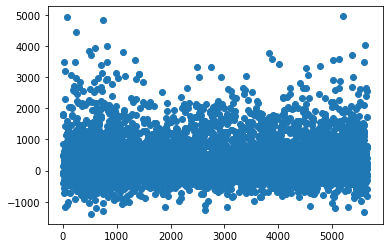

In [181]:
plt.scatter(range(5659), train_man_sample['difference'])

Below uses the z value of $\sqrt{x^2 + y^2}$ and seems to give at most 62.506 difference and at least -1920.325 difference. Much better, now I need to parametrize to see if I can decrease these values.

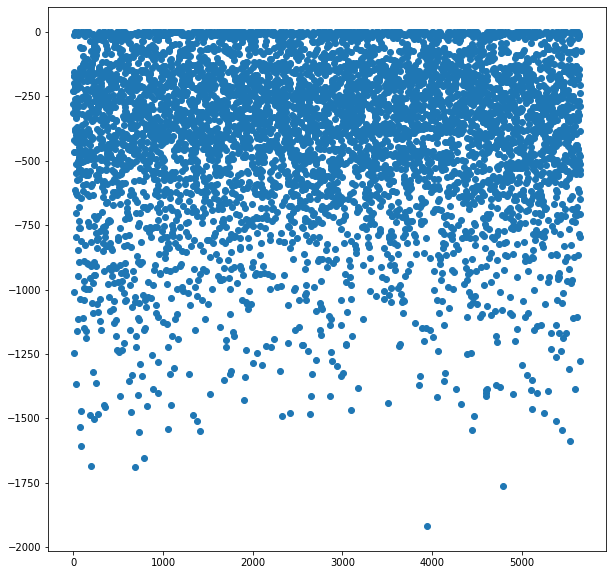

In [227]:
plt.figure(figsize=(10, 10))
plt.scatter(range(5659), train_man_sample['difference'])

In [218]:
max(train_man_sample['difference'])

0.09493543207645416

In [219]:
min(train_man_sample['difference'])

-1917.6607108178432

In [244]:
train_man_sample['difference'].mean()

-390.36478917602864

With an average undershoot of about 390 meters, I think this is okay for now. I will accomodate by making the minimum devation smaller, to try and combat the fact that my naive distance calculator will more than likely give a smaller distance than what is actually needed to get from point A to point B

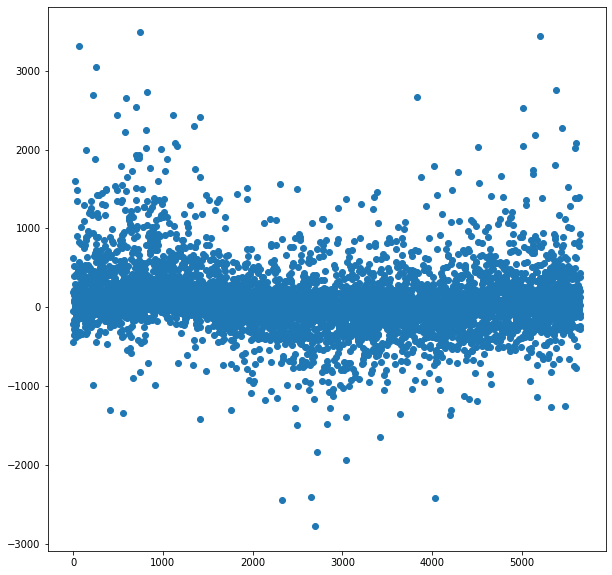

In [243]:
plt.figure(figsize=(10, 10))
plt.scatter(range(5653), train_man_sample['duration_difference'])

In [245]:
max(train_man_sample['duration_difference'])

3492.399959282253

In [246]:
min(train_man_sample['duration_difference'])

-2774.303060335335

In [247]:
train_man_sample['duration_difference'].mean()

86.61992285032953

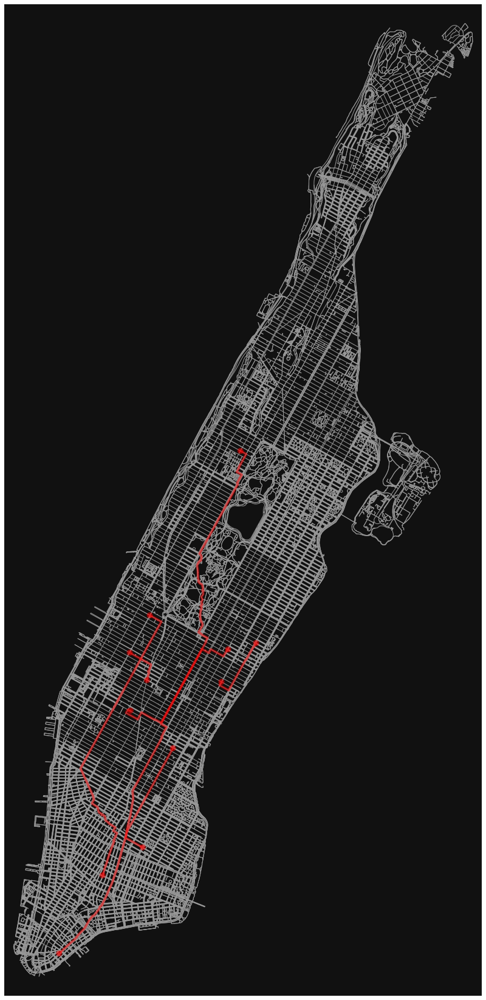

In [233]:
outliers = list(train_man_sample['pp_to_dp'][train_man_sample['duration_difference']<-20000])
fig, ax = ox.plot_graph_routes(G_oms, outliers, figsize=(30, 30), route_linewidth=6, node_size=0)

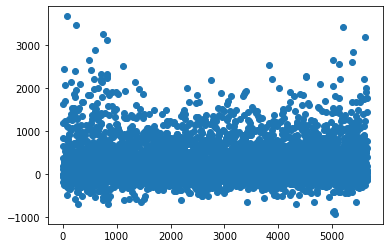

In [199]:
plt.scatter(range(5659), train_man_sample['difference'])

In [200]:
print(max(train_man_sample['difference']))
print(min(train_man_sample['difference']))

3667.488875291052
-931.8763209166384


In [208]:
train_man_sample[train_man_sample['difference'] < -1000]

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_date,pp_to_dp,len_pp_to_dp,approximate_path_length,difference
237110,id0137659,2,2016-04-09 00:01:17,2016-04-09 00:27:06,1,-74.003777,40.726040,-73.947571,40.771271,N,1549,2016-04-09,"[8307641858, 8307641857, 6491645895, 830764185...",8129.175,7014.037300,-1115.137700
1040371,id2353300,1,2016-04-09 00:02:59,2016-04-09 00:16:50,1,-73.997047,40.741989,-73.989021,40.777088,N,831,2016-04-09,"[42427374, 42439834, 42435610, 42427381, 58499...",4912.344,3900.779639,-1011.564361
428162,id0566572,1,2016-04-09 00:08:27,2016-04-09 00:31:49,1,-73.982018,40.727936,-73.983566,40.779354,N,1402,2016-04-09,"[4216045845, 4216045840, 4216045829, 830947950...",7147.056,5766.914331,-1380.141669
556982,id1312157,2,2016-04-09 00:11:13,2016-04-09 00:46:19,1,-73.993523,40.720028,-73.959053,40.819633,N,2106,2016-04-09,"[1289044024, 7579115376, 7465422049, 823190972...",12567.466,11413.625320,-1153.840680
594037,id2161722,2,2016-04-09 00:11:20,2016-04-09 00:25:08,1,-73.966003,40.762089,-73.997383,40.754711,N,828,2016-04-09,"[6177439759, 42447020, 42447009, 42447007, 424...",3864.522,2858.404457,-1006.117543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1344809,id2802482,2,2016-04-09 23:38:43,2016-04-09 23:57:36,1,-73.964241,40.791592,-73.980766,40.723358,N,1133,2016-04-09,"[3377460312, 3377460313, 3377460317, 120380652...",9260.472,7667.171364,-1593.300636
554769,id3642820,2,2016-04-09 23:43:00,2016-04-10 00:05:37,1,-74.003342,40.726891,-73.960381,40.763771,N,1357,2016-04-09,"[7465100697, 7465100696, 8231934394, 823193439...",6650.998,5636.017817,-1014.980183
667031,id1749212,1,2016-04-09 23:46:55,2016-04-10 00:07:28,1,-73.959892,40.762154,-73.958977,40.809219,N,1233,2016-04-09,"[4918486819, 4918486923, 4918486817, 42431661,...",6631.718,5233.757180,-1397.960820
798719,id1001817,2,2016-04-09 23:51:41,2016-04-10 00:04:05,1,-74.007347,40.741192,-73.976440,40.752670,N,744,2016-04-09,"[8262308722, 8262308688, 8262308684, 826230868...",4013.820,3004.590282,-1009.229718


In [250]:
data_within_range

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_date,pp_to_dp,len_pp_to_dp,approximate_path_length
20224,id3746230,1,2016-04-09 00:00:08,2016-04-09 00:10:22,1,-73.991249,40.734783,-73.975861,40.723957,Y,614,2016-04-09,"[4983147898, 7581217744, 7581217746, 719628477...",2099.905,2578.716564
398351,id1534170,2,2016-04-09 00:01:02,2016-04-09 00:11:54,1,-73.988678,40.717751,-73.990372,40.723560,N,652,2016-04-09,"[8231896473, 2567557320, 7465370993, 746537099...",890.853,796.431043
359004,id2107058,2,2016-04-09 00:01:05,2016-04-09 00:37:40,1,-74.009132,40.716461,-73.981361,40.780788,N,2195,2016-04-09,"[8304497527, 8304497528, 8304498508, 830449848...",7846.246,9634.331035
237110,id0137659,2,2016-04-09 00:01:17,2016-04-09 00:27:06,1,-74.003777,40.726040,-73.947571,40.771271,N,1549,2016-04-09,"[8307641858, 8307641857, 6491645895, 830764185...",8129.175,9919.124651
802852,id0596164,2,2016-04-09 00:01:53,2016-04-09 00:12:59,1,-73.983719,40.730160,-73.990921,40.718391,N,666,2016-04-09,"[8309479585, 8309479591, 8309479586, 830947927...",1452.133,1941.593837
699509,id1990441,1,2016-04-09 00:01:54,2016-04-09 00:05:15,1,-73.956367,40.778484,-73.961784,40.767258,N,201,2016-04-09,"[42435509, 42447126, 42439399, 42447115, 42438...",1550.599,1695.376726
1185411,id3735664,1,2016-04-09 00:02:32,2016-04-09 00:26:39,1,-73.965034,40.759678,-73.995377,40.719551,N,1447,2016-04-09,"[6188803954, 42432861, 42442960, 42442959, 424...",5304.118,7124.314330
485442,id1619401,2,2016-04-09 00:02:35,2016-04-09 00:11:42,1,-73.988426,40.739613,-73.993515,40.745354,N,547,2016-04-09,"[5481897719, 4276517116, 42428192, 8264671706,...",1296.257,1235.481221
142470,id3045845,1,2016-04-09 00:02:49,2016-04-09 00:15:34,1,-74.000229,40.737495,-74.014061,40.702534,N,765,2016-04-09,"[8309479755, 8262308355, 8262308356, 826230835...",4273.906,5111.928938
813355,id3608091,2,2016-04-09 00:02:52,2016-04-09 00:09:53,1,-74.004196,40.733349,-74.006775,40.743858,N,421,2016-04-09,"[8307642027, 8307642026, 4841945995, 830764201...",1511.191,1397.582597


In [251]:
G_oms_speeds = ox.speed.add_edge_speeds(G_oms, hwy_speeds=None, fallback=None, precision=2)

In [252]:
G_oms_speeds

In [257]:
G_oms_speeds.edges

OutMultiEdgeView([(30807314, 4332491202, 0), (30807314, 2057103273, 0), (30807314, 6579409036, 0), (30807314, 1203806263, 0), (30978747, 42442164, 0), (30978747, 4257949439, 0), (30978747, 4256322265, 0), (30978747, 4286592925, 0), (30978752, 4257949517, 0), (30978752, 4257949513, 0), (30978752, 4257949514, 0), (30978752, 1492282482, 0), (42421728, 7784826655, 0), (42421728, 7784826657, 0), (42421728, 7784826658, 0), (42421728, 7784826659, 0), (42421731, 42437916, 0), (42421731, 42432737, 0), (42421731, 3602678205, 0), (42421731, 42421737, 0), (42421737, 42437917, 0), (42421737, 42421741, 0), (42421737, 42421731, 0), (42421741, 6207264907, 0), (42421741, 42421737, 0), (42421741, 42432756, 0), (42421745, 6900903299, 0), (42421745, 42428751, 0), (42421745, 1061531654, 0), (42421749, 6900903307, 0), (42421749, 42431118, 0), (42421749, 7785782268, 0), (42421751, 7785782268, 0), (42421751, 5004570628, 0), (42421751, 42432764, 0), (42421769, 42443347, 0), (42421769, 3718672429, 0), (42421772

In [258]:
G_oms_speeds[0]

KeyError: 0

In [261]:
G_oms_speeds.edges[30807314, 4332491202,0]

{'osmid': 147089927,
 'highway': 'path',
 'oneway': False,
 'length': 12.695,
 'speed_kph': 39.04}

Share a similar path direction


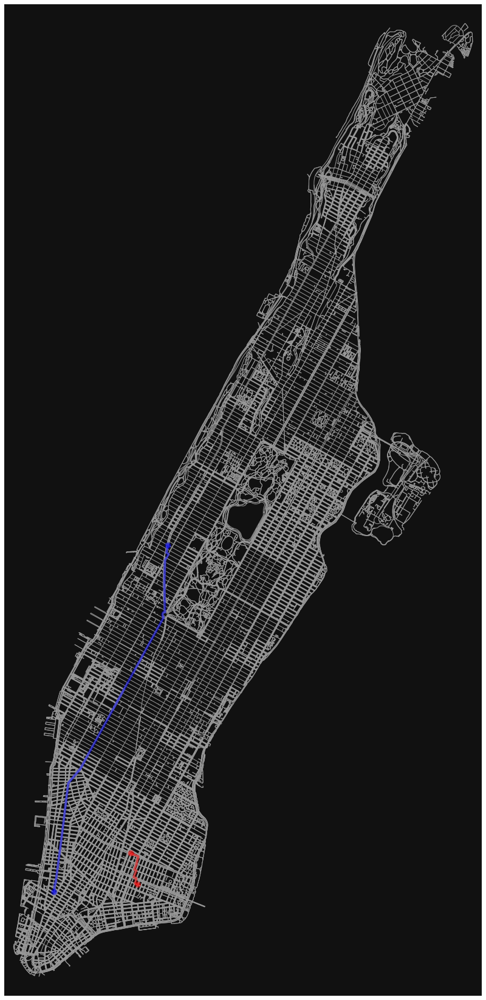

In [267]:
route1 = data_within_range['pp_to_dp'].iloc[1]
route2 = data_within_range['pp_to_dp'].iloc[2]

lat1 = data_within_range['pickup_latitude'].iloc[0]
lon1 = data_within_range['pickup_longitude'].iloc[0]

lat2 = data_within_range['dropoff_latitude'].iloc[0]
lon2 = data_within_range['dropoff_longitude'].iloc[0]

lat3 = data_within_range['pickup_latitude'].iloc[1]
lon3 = data_within_range['pickup_longitude'].iloc[1]

lat4 = data_within_range['dropoff_latitude'].iloc[1]
lon4 = data_within_range['dropoff_longitude'].iloc[1]

# lat = y
# lon = x

change_y1 = max(lat2,lat1) - min(lat2, lat1)
change_x1 = max(lon2, lon1) - min(lon2, lon1)

change_y2 = max(lat4,lat3) - min(lat4, lat3)
change_x2 = max(lon4, lon3) - min(lon4, lon3)

slope1 = change_y1/change_x1
slope2 = change_y2/change_x2

tan_theta1 = abs((slope2-slope1)/(1+slope2*slope1))
tan_theta2 = abs((slope1-slope2)/(1+slope2*slope1))

theta1 = np.arctan(tan_theta1)
theta2 = np.arctan(tan_theta2)

if theta1 <= np.pi/4 or theta2 <= np.pi/4:
    print("Share a similar path direction")

    # equation for route1 pickup and dropoff
    # a1 = 1, b1 = -slope1, c = 0
    #a1y + b1x = 0, pretend that line crosses through 0,0

    # find point that leads to a perpendicular line from start2
    b2 = lat3+(-slope1)*lon3
    
    # point on route1 that leads to perpendicular line from start2
    perp_lat = b2/2
    perp_lon = perp_lat/slope1
    
    dist_route1_start2 = ox.distance.great_circle_vec(lat3, lon3, perp_lat, perp_lon, earth_radius=6371009)
    
    if dist_route1_start2 <= 951:
        fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)

    fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)

    
    
    
    

$d = \frac{\left |a(x_0)+b(y_0)+c \right |}{\sqrt{a^2+b^2}}$

In [353]:
# lat = y
# lon = x

#def calc_line_params(lat1, lon1, lat2, lon2):
    # y = mx + b
#    change_y = max(lat2,lat1) - min(lat2, lat1)
#    change_x = max(lon2, lon1) - min(lon2, lon1)
#    
#    slope = change_y/change_x
#    
#    y_int = lat1-slope*lon1
#
#    return slope, y_int

def calc_line_params(x1, y1, x2, y2):
    # y = mx + b
    
    change_y = (y2-y1)
    change_x = (x2-x1)
    
    slope = change_y/change_x
    
    y_int = y1 - slope*x1
    
    return slope, y_int

def dist_route_to_point(route_start, route_end, point):
    lat1 = route_start[0]
    lon1 = route_start[1]
    
    lat2 = route_end[0]
    lon2 = route_end[1]
    
    lat3 = point[0]
    lon3 = point[1]
    
    x1 = ox.distance.great_circle_vec(0, 0, 0, lon1, earth_radius=6371009)
    y1 = ox.distance.great_circle_vec(0, 0, lat1, 0, earth_radius=6371009)
    
    x2 = ox.distance.great_circle_vec(0, 0, 0, lon2, earth_radius=6371009)
    y2 = ox.distance.great_circle_vec(0, 0, lat2, 0, earth_radius=6371009)
    
    x3 = ox.distance.great_circle_vec(0, 0, 0, lon3, earth_radius=6371009)
    y3 = ox.distance.great_circle_vec(0, 0, lat3, 0, earth_radius=6371009)

    a1, c1 = calc_line_params(x1, y1, x2, y2)
    
    dist = abs((a1*x3 - y3 + c1))/np.sqrt(a1**2 + 1)
    
    return dist
    
def angle_between_slopes(start_A, end_A, start_B, end_B):
    lat1 = start_A[0]
    lon1 = start_A[1]
    
    lat2 = end_A[0]
    lon2 = end_A[1]
    
    lat3 = start_B[0]
    lon3 = start_B[1]
    
    lat4 = end_B[0]
    lon4 = end_B[1]
    
    x1 = ox.distance.great_circle_vec(0, 0, 0, lon1, earth_radius=6371009)
    y1 = ox.distance.great_circle_vec(0, 0, lat1, 0, earth_radius=6371009)
    
    x2 = ox.distance.great_circle_vec(0, 0, 0, lon2, earth_radius=6371009)
    y2 = ox.distance.great_circle_vec(0, 0, lat2, 0, earth_radius=6371009)
    
    x3 = ox.distance.great_circle_vec(0, 0, 0, lon3, earth_radius=6371009)
    y3 = ox.distance.great_circle_vec(0, 0, lat3, 0, earth_radius=6371009)
    
    x4 = ox.distance.great_circle_vec(0, 0, 0, lon4, earth_radius=6371009)
    y4 = ox.distance.great_circle_vec(0, 0, lat4, 0, earth_radius=6371009)
    
    a1, c1 = calc_line_params(x1, y1, x2, y2)
    a2, c2 = calc_line_params(x3, y3, x4, y4)
    
    x1_points = np.linspace(600000, 1000000, 1000)
    y1_points = a1*x1_points+c1
    
    x2_points = np.linspace(600000, 1000000, 1000)
    y2_points = a2*x1_points+c2
    
    fig, ax = plt.subplots()
    
    ax.plot(x1_points, y1_points)
    ax.plot(x2_points, y2_points)

    #change1_y = max(lat2,lat1) - min(lat2, lat1)
    #change1_x = max(lon2, lon1) - min(lon2, lon1)
    
    change1_y = (y2-y1)
    change1_x = (x2-x1)
    
    change2_y = (y4-y3)
    change2_x = (x4-x3)

    #change2_y = max(lat4,lat3) - min(lat4, lat3)
    #change2_x = max(lon4, lon3) - min(lon4, lon3)

    slope1 = change1_y/change1_x
    slope2 = change2_y/change2_x

    tan_theta1 = abs((slope2-slope1)/(1+slope2*slope1))
    tan_theta2 = abs((slope1-slope2)/(1+slope2*slope1))

    theta1 = np.arctan(tan_theta1)
    theta2 = np.arctan(tan_theta2)

    return theta1, theta2

# four permutations that make sense for ridesharing
# ABAB
# ABBA
# BABA
# BAAB

def shareable(route_A, route_B):
    """
    takes as input the row of each route within the database
    """
    max_dev = 400
    
    start_A = (route_A['pickup_latitude'], route_A['pickup_longitude'])
    end_A = (route_A['dropoff_latitude'], route_A['dropoff_longitude'])
    
    start_B = (route_B['pickup_latitude'], route_B['pickup_longitude'])
    end_B = (route_B['dropoff_latitude'], route_B['dropoff_longitude'])

    theta1, theta2 = angle_between_slopes(start_A, end_A, start_B, end_B)
    
    # check to see if they're going in same general direction first before further tests
    if theta1 <= np.pi/4 or theta2 <= np.pi/4:
        # calculate important distances
        dist_startB_to_A = dist_route_to_point(start_A, end_A, start_B)
        dist_endB_to_A = dist_route_to_point(start_A, end_A, end_B)
        dist_startA_to_B = dist_route_to_point(start_B, end_B, start_A)
        dist_endA_to_B = dist_route_to_point(start_B, end_B, end_A)
        
        #print("DISTANCE FROM START OF B TO ROUTE A: ", dist_startB_to_A)
        #print("DISTANCE FROM END OF B TO ROUTE A: ", dist_endB_to_A)
        #print("DISTANCE FROM START OF A TO ROUTE B: ", dist_startA_to_B)
        #print("DISTANCE FROM END OF A TO ROUTE B: ", dist_endA_to_B)
        
        # ABAB
        # if A starts, A finished in middle of B, therefore start_B must start near A, and end_A must end near B
        if dist_startB_to_A <= max_dev and dist_endA_to_B <= max_dev:
            return (route_A['pp_to_dp'], route_B['pp_to_dp'])
            
        # ABBA
        # if A starts, B finished in middle of A, therefore start_B must start near A, and end_B must end near A
        elif dist_startB_to_A <= max_dev and dist_endB_to_A <= max_dev:
            return (route_A['pp_to_dp'], route_B['pp_to_dp'])
        
        # BABA
        # if B starts, B finishes in middle of A, therefore start_A must start near B, and end_B must end near A
        elif dist_startA_to_B <= max_dev and dist_endB_to_A <= max_dev:
            return (route_A['pp_to_dp'], route_B['pp_to_dp'])
        
        # BAAB
        # if B starts, A finishes in middle of B, therefore start_A must start near B, and end_A must end near B
        elif dist_startA_to_B <= max_dev and dist_endA_to_B <= max_dev:
            return (route_A['pp_to_dp'], route_B['pp_to_dp'])
        
    return None

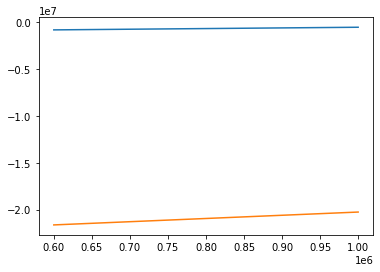

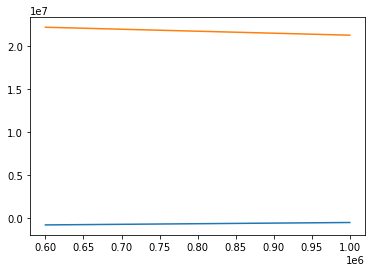

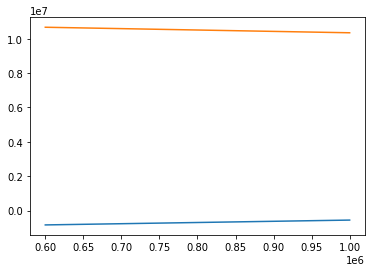

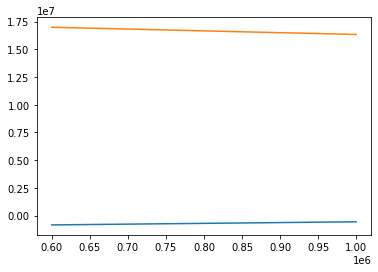

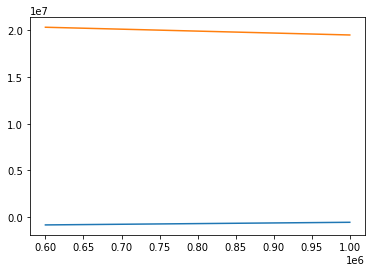

...

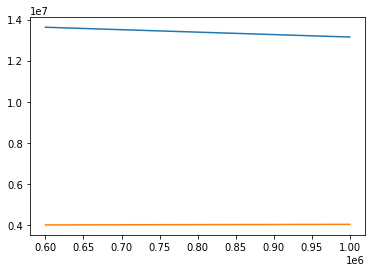

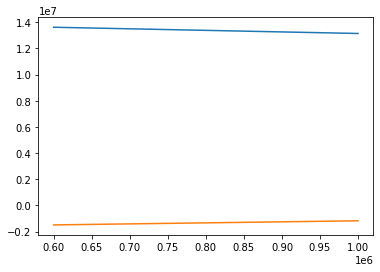

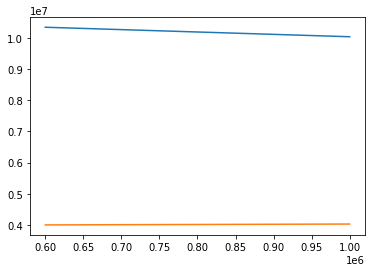

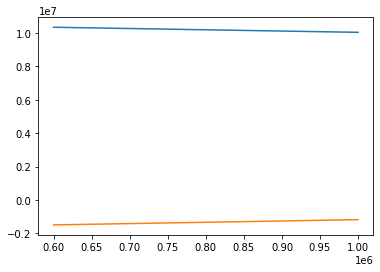

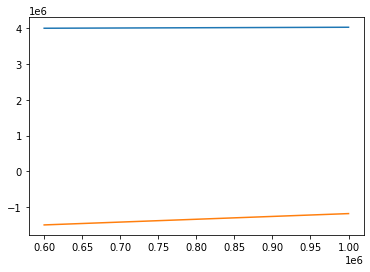

In [354]:
N = len(data_within_range)
shareable_rides = []
for index in range(N-1):
    for index2 in range(index+1, N-1):
        route_A = data_within_range.iloc[index]
        route_B = data_within_range.iloc[index2]

        match = shareable(route_A, route_B)

        if match:
            shareable_rides.append(match)

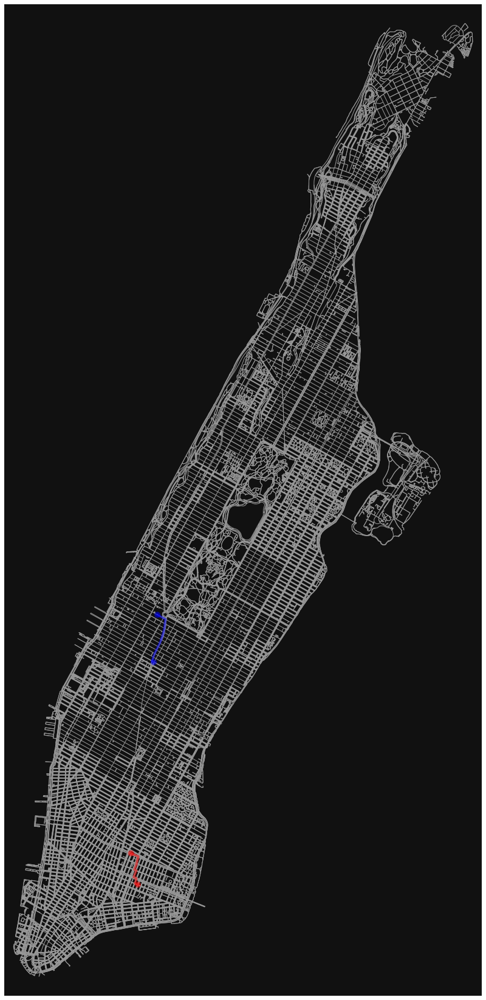

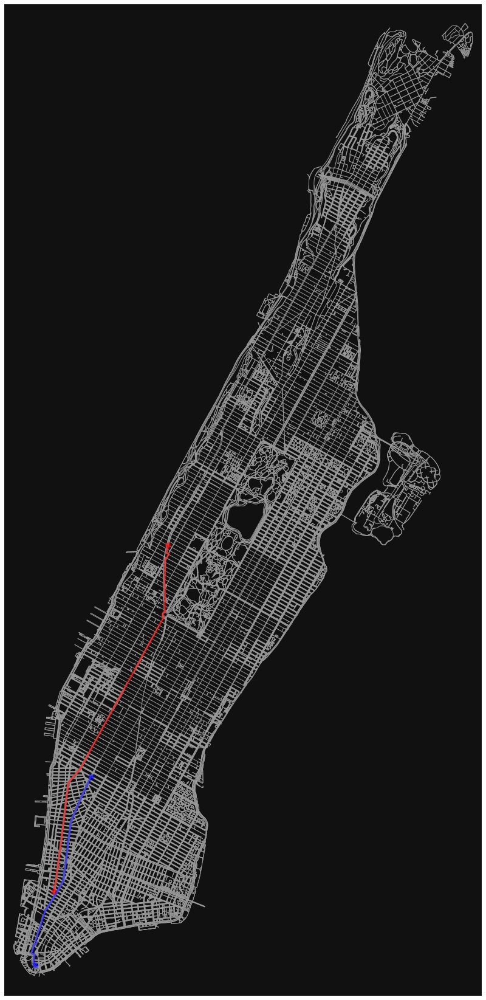

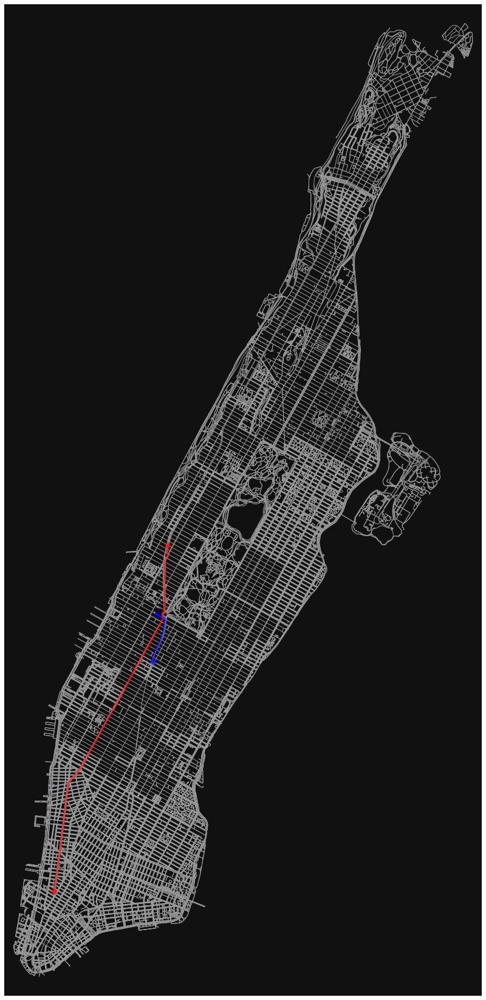

KeyboardInterrupt: 

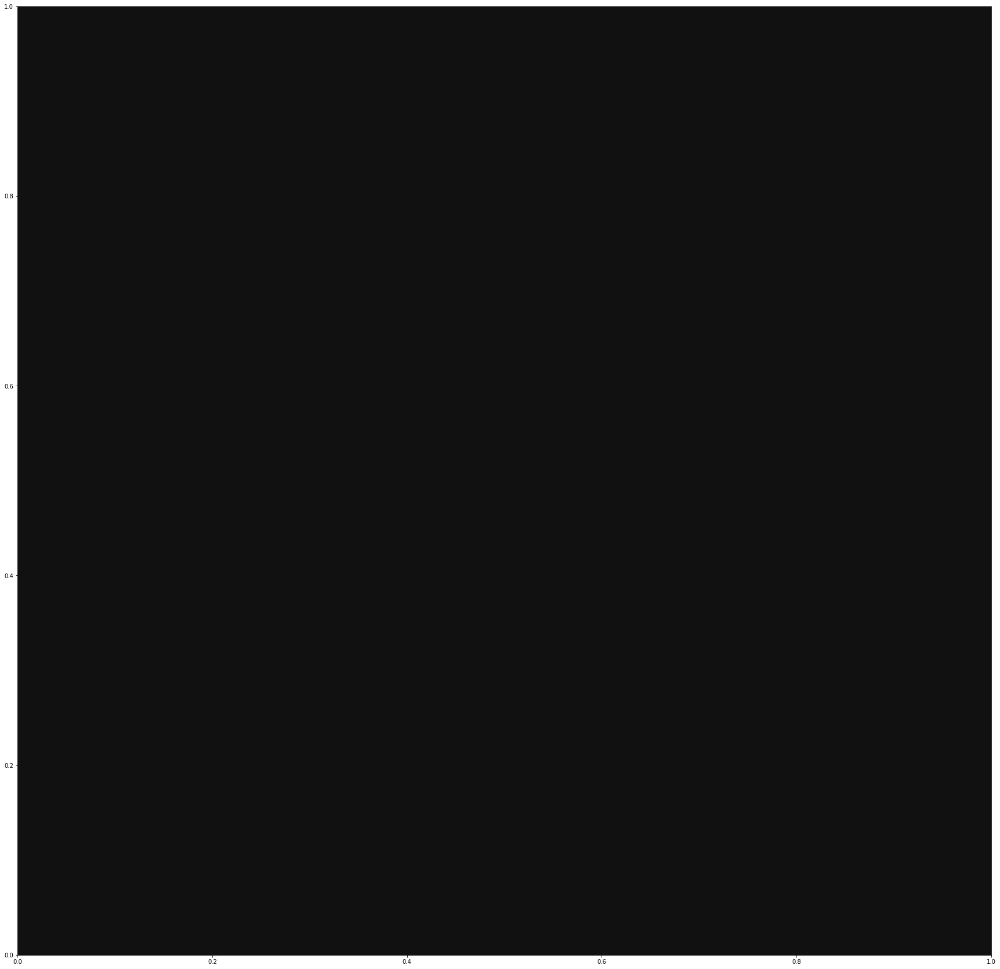

In [352]:
for shareable_routes in shareable_rides:
    
    route1 = shareable_routes[0]
    route2 = shareable_routes[1]
    
    start1 = (G_oms.nodes[route1[0]]['x'], G_oms.nodes[route1[0]]['y'])
    start2 = (G_oms.nodes[route2[0]]['x'], G_oms.nodes[route2[0]]['y'])
    
    end1 = (G_oms.nodes[route1[-1]]['x'], G_oms.nodes[route1[-1]]['y'])
    end2 = (G_oms.nodes[route2[-1]]['x'], G_oms.nodes[route2[-1]]['y'])
    
    pickup_longs = [start1[0], start2[0]]
    pickup_lats = [start1[1], start2[1]]
    #
    dropoff_longs = [end1[0], end2[0]]
    dropoff_lats = [end1[1], end2[1]]

    fig, ax = ox.plot_graph_routes(G_oms, [route1, route2], route_colors=['r','b'], figsize=(30, 30), route_linewidth=6, node_size=0)
    ax.scatter(pickup_longs, pickup_lats, c='y')
    ax.scatter(dropoff_longs, dropoff_lats, c='c')

In [351]:
shareable_rides

[([8231896473,
   2567557320,
   7465370993,
   7465370992,
   3314293720,
   7465363218,
   3314293718,
   8841021136,
   3314293716,
   5296792747,
   7465345748,
   7465345747,
   8231901007,
   7465375816,
   8231901008,
   7465380416,
   5854381582,
   5854381561,
   5854381570,
   42432060,
   5854381562,
   7611187236,
   7480301867,
   7480301866,
   5798966629,
   7480301865,
   7480301863,
   5783028387,
   42451665,
   5783028393],
  [8314977757,
   7597291079,
   42435716,
   7597291078,
   8780665836,
   8780665835,
   8785244294,
   8785244293,
   8785244292,
   8785244282,
   8785244281,
   8785244280,
   8785244271,
   3463816118,
   8785244270,
   8785244263,
   3308681108,
   8785244262,
   8785244253,
   8785244242,
   42428313,
   8785244250,
   42428312,
   42428310,
   42428308,
   42428307,
   42428305,
   42428303,
   4578044149,
   6598535158]),
 ([8304497527,
   8304497528,
   8304498508,
   8304498488,
   8304498497,
   8304498487,
   8304498502,
   830449848